## Procesado de las series temporales

### Importamos las librerías necesarias

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn
import HydroErr as he

from prophet import Prophet
from prophet.plot import add_changepoints_to_plot
from prophet.diagnostics import cross_validation, performance_metrics
from pycaret.time_series import *
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.stats.descriptivestats import describe

from pmdarima.model_selection import train_test_split


import warnings
warnings.filterwarnings("ignore") #Evitamos que se muestren warnings

### Cargamos las series temporales y las procesamos

Se crean cuatro dataframes, uno con la serie orginal a intervalos diarios y tres nuevos dataframes con la serie de aportaciones diarias, mensuales y anuales. Se eliminan los NaN.

In [2]:
#Cambiar por la serie a procesar

df = pd.read_csv('https://raw.githubusercontent.com/aledor07/Evapotranspiration_forecasting/main/Dataset.csv')

#Procesamiento

df["ds"] =  pd.to_datetime(df["Fecha"], format="%d/%m/%Y")

df.set_index(df['ds'], inplace=True)

#Serie diaria

df_d = df[['EtPMon','Temp Mínima (ºC)','Temp Max (ºC)','Velviento (m/s)','Radiación (MJ/m2)']]
df_d.rename(columns={'EtPMon': 'y'}, inplace=True)
df_d= df_d[df_d['y'] != 0]
df_d=df_d.asfreq('D')
df_d.reset_index(inplace=True)
df_d=df_d.fillna(method='bfill')


### Estadísticos de la serie

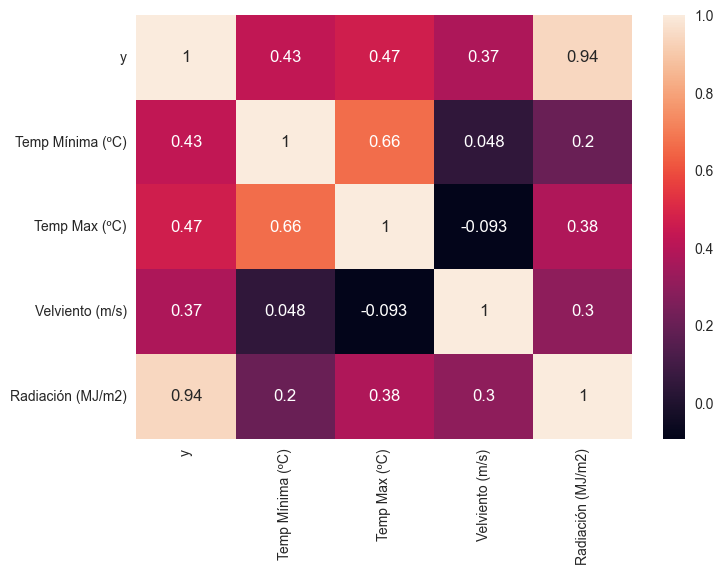

In [3]:
# Matriz de correlación

corr_matrix = df_d.corr()

sn.heatmap(corr_matrix, annot=True)
plt.show()

### Valores de la serie diaria

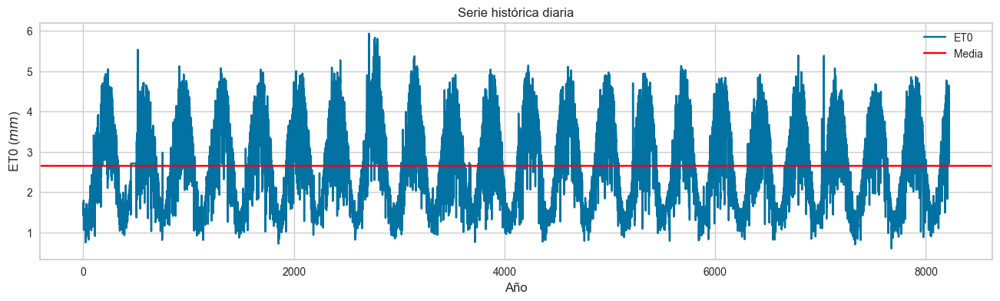

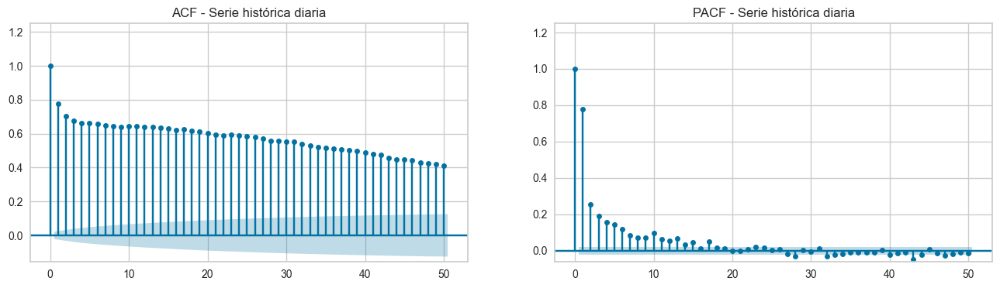

,y,Temp Mínima (ºC),Temp Max (ºC),Velviento (m/s),Radiación (MJ/m2)
nobs,8.221000e+03,8.221000e+03,8221.000000,8221.000000,8.221000e+03
missing,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00
mean,2.641107e+00,1.513452e+01,23.417519,0.361591,1.569142e+01
std_err,1.192401e-02,3.151673e-02,0.031743,0.001556,6.907929e-02
upper_ci,2.664478e+00,1.519629e+01,23.479733,0.364640,1.582681e+01
lower_ci,2.617736e+00,1.507275e+01,23.355304,0.358542,1.555603e+01
std,1.081146e+00,2.857614e+00,2.878118,0.141063,6.263401e+00
iqr,1.780000e+00,4.660000e+00,4.050000,0.170000,9.300000e+00
iqr_normal,1.319516e+00,3.454463e+00,3.002269,0.126021,6.894100e+00
mad,9.188115e-01,2.435402e+00,2.272018,0.105487,5.227285e+00


In [4]:
#Procesamiento de la serie histórica diaria

#Gráfica de la serie histórica
title='Serie histórica diaria'
df_d['y'].plot(title=title,figsize=(16, 4))
plt.axhline(y=np.nanmean(df_d.y),color="red",)
plt.xlabel('Año', fontsize=12)
plt.ylabel('ET0 ($mm$)', fontsize=12)
plt.legend(['ET0','Media'])

#Autocorrelograma
acf(df_d['y'])

#PACF
pacf(df_d['y'],alpha=.05)

lags = 50

#Gráficas conjuntas
fig, ax = plt.subplots(1,2,figsize=(16,4))
plot_acf(df_d['y'],title='ACF - Serie histórica diaria',lags=lags, auto_ylims=True, ax=ax[0])
plot_pacf(df_d['y'],title='PACF - Serie histórica diaria',lags=lags, auto_ylims=True, ax=ax[1])
plt.show()



#Estadísticas de la serie temporal
describe(df_d) 

### Guardado de las serie procesadas a Excel

In [100]:
df_d.to_excel(r'', index=True)

In [32]:
test_size = 0.3 # Cambiar la amplitud de set de datos para el TEST

train , test = train_test_split(df_d, test_size=test_size) #Dividmos el set de datos para entrenar el modelo

print(f"Number of obs. in train data: {len(train)}")
print(f"Number of obs. in test data: {len(test)}")

Number of obs. in train data: 5754
Number of obs. in test data: 2467


# Prophet

In [27]:
## Entrenamiento de modelo Prophet

prophet_model = Prophet(
        
#Hiperparámetros - Cambiar por los de mejor ajuste
                            yearly_seasonality='auto',
                            weekly_seasonality='auto',
                            #seasonality_prior_scale=10,
                            daily_seasonality='auto',
                            #changepoint_prior_scale=0.015,
                            #changepoint_range=0.75,
                            #growth='linear',
                            #interval_width=0.95
    
                            )

#prophet_model.add_regressor('Temp Max (ºC)')
#prophet_model.add_regressor('Temp Mínima (ºC)')
#prophet_model.add_regressor('Radiación (MJ/m2)')


#prophet_model.add_seasonality(name='monthly', period=30.5, fourier_order=7, prior_scale=10, mode ='multiplicative')
prophet_model.fit(train)
    
    
# Creamos el array con el periodo para el que queremos realizar la predicción
prediction_period = prophet_model.make_future_dataframe(periods = len(test), include_history=True)

#prediction_period['Temp Max (ºC)']=df_d['Temp Max (ºC)']
#prediction_period['Temp Mínima (ºC)']=df_d['Temp Mínima (ºC)']
#prediction_period['Radiación (MJ/m2)']=df_d['Radiación (MJ/m2)']

# Se realiza la predicción
forecast = prophet_model.predict(prediction_period)
    
# Valoramos el ajuste con las métricas
real = df_d['y']
real = real.set_axis(df_d['ds'])
    
forecast.yhat[forecast.yhat.lt(0)] = 0 # Se eliminan los valores negativos predictivos

predictions = forecast.iloc[-len(test):]['yhat']
predictions = predictions.set_axis(forecast.iloc[-len(test):]['ds'])
fits = forecast.iloc[:len(train)]['yhat']
fits = fits.set_axis(forecast.iloc[:len(train)]['ds'])
actuals = test['y']
actuals = actuals.set_axis(forecast.iloc[-len(test):]['ds'])
    
RMSE = he.rmse(predictions, actuals)
MAE = he.mae(predictions, actuals)
NSE = he.nse(predictions, actuals)
R2 = he.r_squared(predictions, actuals)

18:41:15 - cmdstanpy - INFO - Chain [1] start processing
18:41:16 - cmdstanpy - INFO - Chain [1] done processing


### Coeficientes

In [13]:
print('El valor de MAE obtenido es: '+str(MAE))
print('El valor de RMSE obtenido es: '+str(RMSE))
print('El valor de NSE obtenido es: '+str(NSE))
print('El valor de R2 obtenido es: '+str(R2))

El valor de MAE obtenido es: 0.4984862296813319
El valor de RMSE obtenido es: 0.6404657842475571
El valor de NSE obtenido es: 0.6222358145071505
El valor de R2 obtenido es: 0.6241004430656414


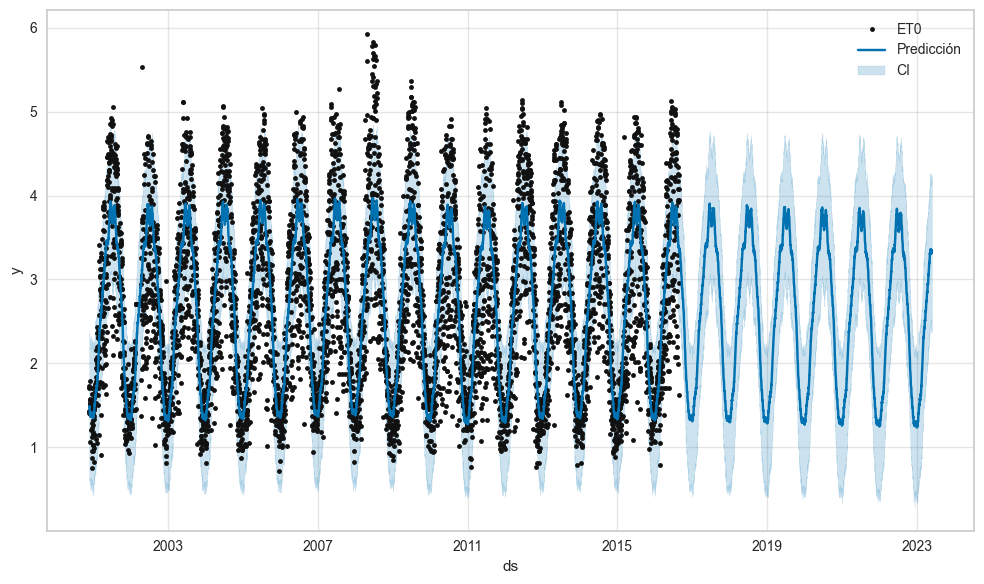

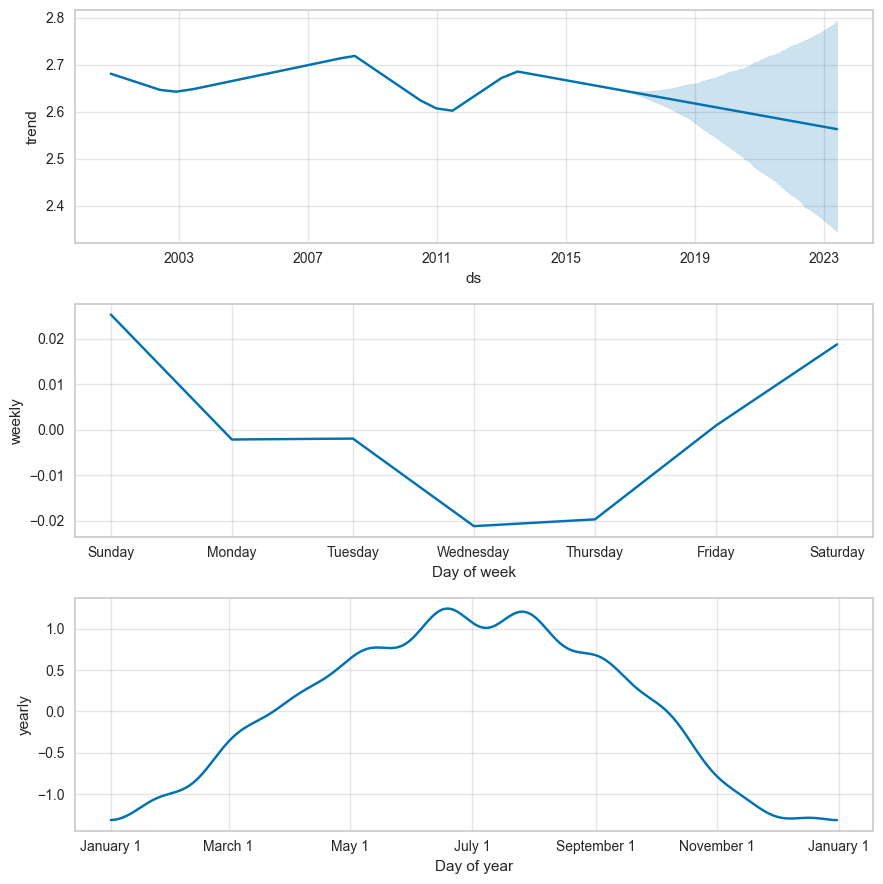

In [14]:
fig1 = prophet_model.plot(forecast)
plt.legend(['ET0', 'Predicción', 'CI'])
plt.show()

fig2 = prophet_model.plot_components(forecast)


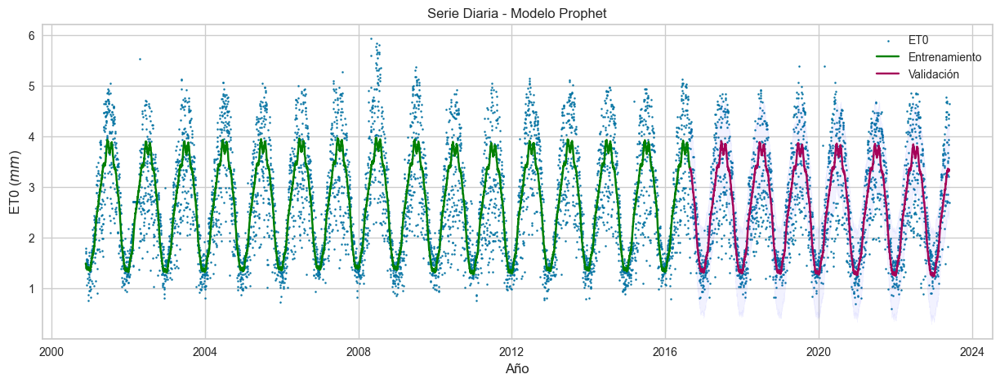

In [15]:
#Mostramos la gráfica con la predicción

fig, ax = plt.subplots(1, 1, figsize=(15, 5))

ax.scatter(real.index, real, s=2)
ax.plot(fits, color = 'green',linestyle = 'solid')
ax.plot(predictions, color = 'm',linestyle = 'solid')
ax.fill_between(predictions.index,
                forecast.iloc[-len(test):]['yhat_lower'],
                forecast.iloc[-len(test):]['yhat_upper'],color='blue',alpha=.05)

plt.title('Serie Diaria - Modelo Prophet')
plt.xlabel('Año', fontsize=12)
plt.ylabel('ET0 ($mm$)', fontsize=12)
plt.legend(['ET0','Entrenamiento','Validación'])

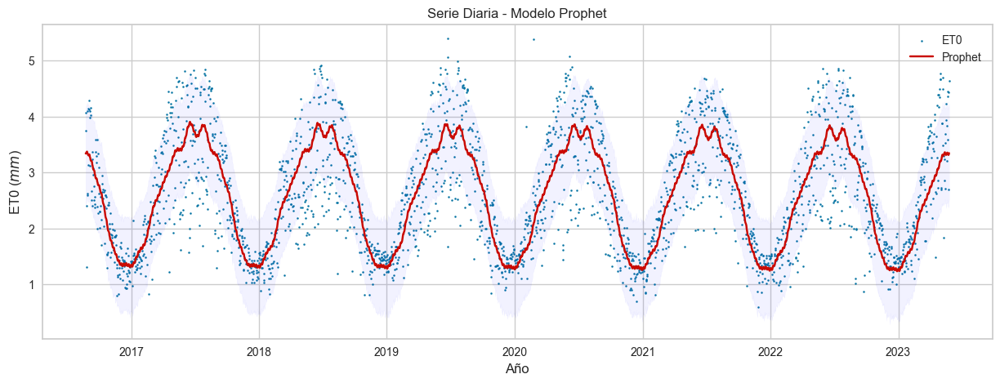

In [16]:
#Mostramos la gráfica con la predicción

fig, ax = plt.subplots(1, 1, figsize=(15, 5))


ax.scatter(real.iloc[-len(test):].index, real.iloc[-len(test):], s=2)
ax.plot(predictions, color = 'r',linestyle = 'solid')
ax.fill_between(predictions.index,
                forecast.iloc[-len(test):]['yhat_lower'],
                forecast.iloc[-len(test):]['yhat_upper'],color='blue',alpha=.05)

plt.title('Serie Diaria - Modelo Prophet')
plt.xlabel('Año', fontsize=12)
plt.ylabel('ET0 ($mm$)', fontsize=12)
plt.legend(['ET0','Prophet'])

## Predicciones

In [123]:
#Cambiar hiperparámetros y periodo de predicción

prophet_model = Prophet(
        #Hiperparámetros - Cambiar por los de mejor ajuste
                        yearly_seasonality='auto',
                        weekly_seasonality='auto',
                        #seasonality_prior_scale=10,
                        #daily_seasonality=False,
                        #changepoint_prior_scale=0.01,
                        #changepoint_range=0.70,
                        #growth='linear',
                        interval_width=0.95
    
                        )

#prophet_model.add_regressor('Temp Max (ºC)')
#prophet_model.add_regressor('Temp Mínima (ºC)')
#prophet_model.add_regressor('Radiación (MJ/m2)')

#prophet_model.add_seasonality(name='monthly', period=30.5, fourier_order=7, prior_scale=10, mode ='multiplicative')
prophet_model.fit(df_d)

prediction_period = prophet_model.make_future_dataframe(periods = 7, freq ='D', include_history=False)

#prediction_period['Temp Max (ºC)']=df_d['Temp Max (ºC)'].iloc[-7:].to_numpy()
#prediction_period['Temp Mínima (ºC)']=df_d['Temp Mínima (ºC)'].iloc[-7:].to_numpy()
#prediction_period['Radiación (MJ/m2)']=df_d['Radiación (MJ/m2)'].iloc[-7:].to_numpy()



forecast = prophet_model.predict(prediction_period)
forecast.yhat[forecast.yhat.lt(0)] = 0 # Se eliminan los valores negativos predictivos
forecast

18:36:16 - cmdstanpy - INFO - Chain [1] start processing
18:36:20 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Radiación (MJ/m2),Radiación (MJ/m2)_lower,Radiación (MJ/m2)_upper,additive_terms,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2023-05-27,2.667448,2.788506,3.508585,2.667448,2.667448,0.185925,0.185925,0.185925,0.501277,...,-0.000076,-0.000076,-0.000076,0.315427,0.315427,0.315427,0.0,0.0,0.0,3.168725
1,2023-05-28,2.667476,3.242718,3.948245,2.667476,2.667476,0.609127,0.609127,0.609127,0.937677,...,0.006576,0.006576,0.006576,0.321974,0.321974,0.321974,0.0,0.0,0.0,3.605153
2,2023-05-29,2.667504,3.908026,4.652607,2.667504,2.667504,1.280895,1.280895,1.280895,1.611845,...,0.002073,0.002073,0.002073,0.328877,0.328877,0.328877,0.0,0.0,0.0,4.279349
3,2023-05-30,2.667532,4.044474,4.738742,2.667532,2.667532,1.386695,1.386695,1.386695,1.724140,...,0.001333,0.001333,0.001333,0.336112,0.336112,0.336112,0.0,0.0,0.0,4.391672
4,2023-05-31,2.667560,4.083733,4.816327,2.667560,2.667560,1.445332,1.445332,1.445332,1.787311,...,-0.001673,-0.001673,-0.001673,0.343652,0.343652,0.343652,0.0,0.0,0.0,4.454871
5,2023-06-01,2.667588,2.501453,3.191609,2.667588,2.667588,-0.163343,-0.163343,-0.163343,0.185363,...,-0.002754,-0.002754,-0.002754,0.351460,0.351460,0.351460,0.0,0.0,0.0,2.852951
6,2023-06-02,2.667616,4.239879,4.961747,2.667616,2.667616,1.577901,1.577901,1.577901,1.931915,...,-0.005479,-0.005479,-0.005479,0.359493,0.359493,0.359493,0.0,0.0,0.0,4.599531


In [124]:
forecast.to_excel(r'', index=True)

# PyCaret

In [17]:
s = setup(train['y'], fh = 14,seasonal_period = 365, session_id = 123)

check_stats()

,Description,Value
0,session_id,123
1,Target,y
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(5754, 1)"
5,Transformed data shape,"(5754, 1)"
6,Transformed train set shape,"(5740, 1)"
7,Transformed test set shape,"(14, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,Test,Test Name,Data,Property,Setting,Value
0,Summary,Statistics,Transformed,Length,,5754.0
1,Summary,Statistics,Transformed,# Missing Values,,0.0
2,Summary,Statistics,Transformed,Mean,,2.667249
3,Summary,Statistics,Transformed,Median,,2.52
4,Summary,Statistics,Transformed,Standard Deviation,,1.09645
5,Summary,Statistics,Transformed,Variance,,1.202203
6,Summary,Statistics,Transformed,Kurtosis,,-0.8549
7,Summary,Statistics,Transformed,Skewness,,0.424263
8,Summary,Statistics,Transformed,# Distinct Values,,460.0
9,White Noise,Ljung-Box,Transformed,Test Statictic,"{'alpha': 0.05, 'K': 24}",57687.245533


In [18]:
best = compare_models()

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
exp_smooth,Exponential Smoothing,1.5462,1.3294,0.7965,0.9691,0.2534,0.2204,-0.1706,0.1800
ets,ETS,1.5462,1.3295,0.7965,0.9691,0.2535,0.2204,-0.1707,0.1567
theta,Theta Forecaster,1.5462,1.3287,0.7965,0.9685,0.2532,0.2204,-0.1693,0.0733
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.5699,1.3170,0.8086,0.9599,0.2172,0.2237,-0.2008,0.5033
auto_arima,Auto ARIMA,1.5780,1.3029,0.8129,0.9497,0.2508,0.2243,-0.1310,13.8633
croston,Croston,1.6432,1.3268,0.8465,0.9672,0.2670,0.2328,-0.1735,0.0433
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,1.7933,1.4762,0.9237,1.0760,0.2416,0.2566,-0.6030,0.2667
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.8063,1.4977,0.9304,1.0916,0.2402,0.2595,-0.6418,0.4867
dt_cds_dt,Decision Tree w/ Cond. Deseasonalize & Detrending,1.8107,1.6427,0.9327,1.1974,0.2982,0.2573,-0.7928,0.2367
knn_cds_dt,K Neighbors w/ Cond. Deseasonalize & Detrending,1.8189,1.4945,0.9369,1.0893,0.2458,0.2689,-0.5914,0.4100


Processing:   0%|          | 0/113 [00:00<?, ?it/s]

In [20]:
top2 = compare_models(n_select = 2)
blender = blend_models(top2)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
exp_smooth,Exponential Smoothing,1.5462,1.3294,0.7965,0.9691,0.2534,0.2204,-0.1706,0.1467
ets,ETS,1.5462,1.3295,0.7965,0.9691,0.2535,0.2204,-0.1707,0.1233
theta,Theta Forecaster,1.5462,1.3287,0.7965,0.9685,0.2532,0.2204,-0.1693,0.0733
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.5699,1.3170,0.8086,0.9599,0.2172,0.2237,-0.2008,0.4200
auto_arima,Auto ARIMA,1.5780,1.3029,0.8129,0.9497,0.2508,0.2243,-0.1310,13.3833
croston,Croston,1.6432,1.3268,0.8465,0.9672,0.2670,0.2328,-0.1735,0.0367
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,1.7933,1.4762,0.9237,1.0760,0.2416,0.2566,-0.6030,0.2867
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.8063,1.4977,0.9304,1.0916,0.2402,0.2595,-0.6418,0.4900
dt_cds_dt,Decision Tree w/ Cond. Deseasonalize & Detrending,1.8107,1.6427,0.9327,1.1974,0.2982,0.2573,-0.7928,0.2200
knn_cds_dt,K Neighbors w/ Cond. Deseasonalize & Detrending,1.8189,1.4945,0.9369,1.0893,0.2458,0.2689,-0.5914,0.3567


Processing:   0%|          | 0/114 [00:00<?, ?it/s]

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,5697.0000,1.5136,1.3060,0.7787,0.9509,0.2067,0.2148,-0.1490
1,5711.0000,1.0980,1.0648,0.5656,0.7762,0.1735,0.1447,-0.0214
2,5725.0000,2.0269,1.6177,1.0452,1.1802,0.3802,0.3017,-0.3416
Mean,nan,1.5462,1.3295,0.7965,0.9691,0.2535,0.2204,-0.1707
SD,nan,0.3799,0.2263,0.1962,0.1654,0.0906,0.0642,0.1316


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

In [22]:
plot_model(blender, plot = 'forecast')

In [23]:
plot_model(plot="diagnostics", fig_kwargs={"height": 800, "width": 1000})